<div style="background: linear-gradient(to right, #FFB6B6, #FFD700); padding: 20px 50px; border-radius: 10px; text-align: center;">
    <img src="/kaggle/input/logosh/LOGO-png.png" alt="Logo" style="max-width: 200px; margin: 0; display: block; margin-left: auto; margin-right: auto;">
    <h1 style="font-family: 'Brush Script MT', cursive; font-size: 64px; color: white; margin-top: 10px;">
        <span style="color: #007a5f;">Sham</span><span style="color: #fd8d08;">Soon</span>
    </h1>
</div>

<div style="background: linear-gradient(to right, #FFEDD5, #FFB84D); padding: 10px; border-radius: 10px; box-shadow: 0px 4px 6px rgba(0, 0, 0, 0.1);">
    <h2 style="font-family: Arial, sans-serif; font-size: 28px; text-align: left; color: #007a5f; margin: 0;">
        Import Scripts:
    </h2>
</div>

In [1]:
!cp /kaggle/input/billlll/model_training.py /kaggle/working/
!cp /kaggle/input/buildi/model_building.py /kaggle/working/
!cp /kaggle/input/finall/fine_tuning.py /kaggle/working/
!cp /kaggle/input/scrpt-code/data_loading.py /kaggle/working/
!cp /kaggle/input/visulll/utils.py /kaggle/working/
!cp /kaggle/input/model21/model2_building.py /kaggle/working/

In [2]:

# Import scripts
from data_loading import load_dataset
from model_building import build_model
from model2_building import build_smaller_model
from model_training import train_model
from utils import plot_training_history, evaluate_model, visualize_predictions , predict_image_class
from fine_tuning import fine_tune_model
#from fine_tuning2 import fine_tune_model

In [3]:
# Configuration
IMG_HEIGHT = 244
IMG_WIDTH = 244
BATCH_SIZE = 32
IMAGE_SIZE = (224, 224)
DATA_DIR = "/kaggle/input/faulty-solar-panel-images/Faulty_solar_panel"

<div style="background: linear-gradient(to right, #FFEDD5, #FFB84D); padding: 10px; border-radius: 10px; box-shadow: 0px 4px 6px rgba(0, 0, 0, 0.1);">
    <h2 style="font-family: Arial, sans-serif; font-size: 28px; text-align: left; color:#007a5f; margin: 0;">
        Load Data:
    </h2>
</div>


In [4]:

# Load the dataset
train_ds, val_ds = load_dataset(DATA_DIR, IMG_HEIGHT, IMG_WIDTH, BATCH_SIZE)

Found 4372 files belonging to 6 classes.
Using 3498 files for training.
Found 4372 files belonging to 6 classes.
Using 874 files for validation.


In [5]:
# Get class names
CLASS_NAMES = train_ds.class_names
print("Class names:", CLASS_NAMES)

Class names: ['Bird-drop', 'Clean', 'Dusty', 'Electrical-damage', 'Physical-Damage', 'Snow-Covered']


<div style="background: linear-gradient(to right, #FFEDD5, #FFB84D); padding: 10px; border-radius: 10px; box-shadow: 0px 4px 6px rgba(0, 0, 0, 0.1);">
    <h2 style="font-family: Arial, sans-serif; font-size: 28px; text-align: left; color: #007a5f; margin: 0;">
        Modeling:
    </h2>
</div>

# MobileNetV2 Model

In [6]:


# Build the model
model = build_smaller_model(IMG_HEIGHT, IMG_WIDTH, len(CLASS_NAMES))
model.summary()

/kaggle/working/model2_building.py:8: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 244, 244, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ true_divide (TrueDivide)             │ (None, 244, 244, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ subtract (Subtract)                  │ (None, 244, 244, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 8, 8, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 6)                   │           7,686 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,265,670 (8.64 MB)

 Trainable params: 7,686 (30.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
from tensorflow.keras.utils import plot_model

# Plot the model architecture and save it as an image
plot_model(model, to_file='cnn_plot.png', show_shapes=True, show_layer_names=True)

In [8]:
# Train the model
EPOCHS = 10
print("Training the model...")
history = train_model(model, train_ds, val_ds, EPOCHS)

110/110 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.8733 - loss: 0.3752 - val_accuracy: 0.8959 - val_loss: 0.3535
Epoch 8/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8729 - loss: 0.3618 - val_accuracy: 0.8936 - val_loss: 0.3411
Epoch 9/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - accuracy: 0.8900 - loss: 0.3228 - val_accuracy: 0.8947 - val_loss: 0.3390
Epoch 10/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.8907 - loss: 0.3264 - val_accuracy: 0.9005 - val_loss: 0.3205
Restoring model weights from the end of the best epoch: 10.


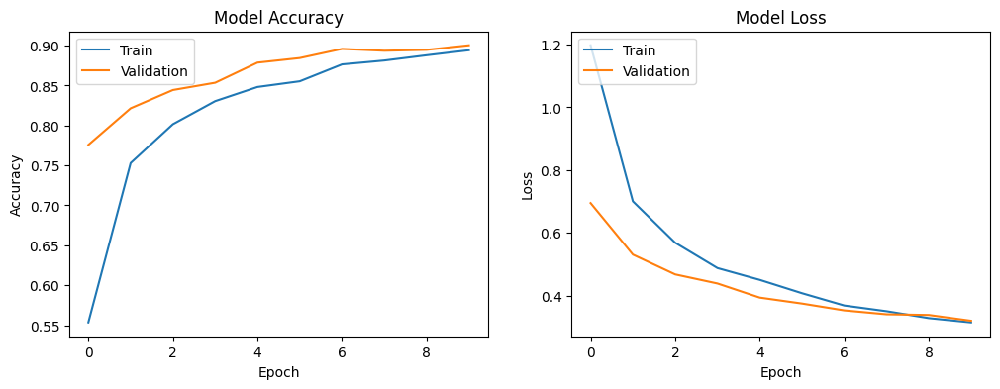

In [9]:
# Plot training history
plot_training_history(history)

In [10]:
# Evaluate model
evaluate_model(model, val_ds)

28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.9063 - loss: 0.3058
Validation Loss: 0.32053786516189575
Validation Accuracy: 0.9004576802253723


(0.32053786516189575, 0.9004576802253723)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


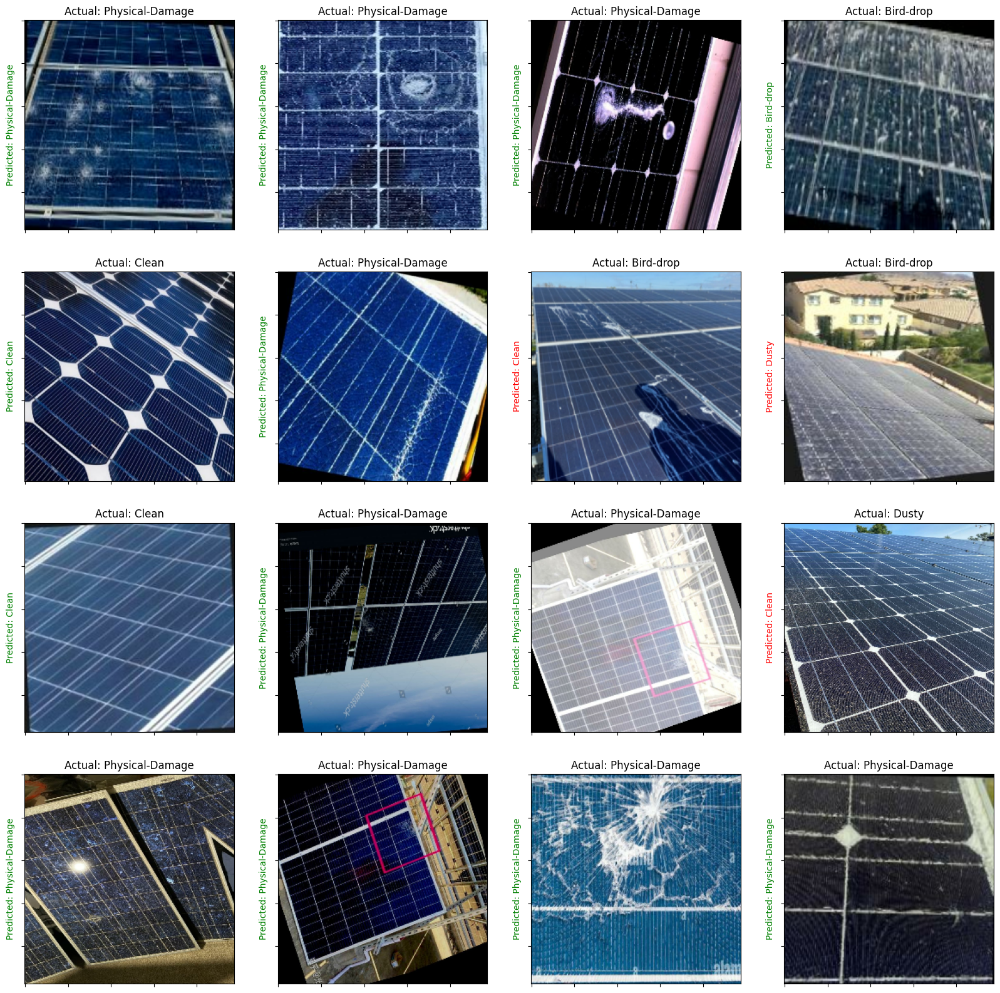

In [11]:
# Visualize predictions
visualize_predictions(model, val_ds, CLASS_NAMES)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


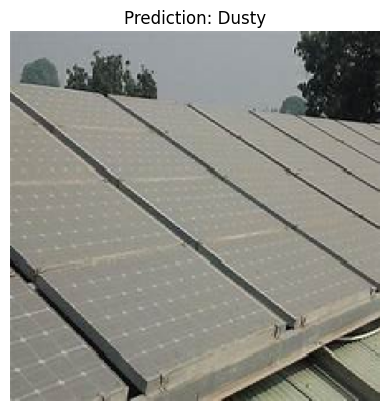

The image belongs to the class: Dusty
Predicted class index: 2
Predicted class label: Dusty


In [12]:
from tensorflow.keras.preprocessing import image
# Predict the class of a specific image
img_path = '/kaggle/input/faults/dust.jpg'  
predicted_class_index = predict_image_class(model, img_path, CLASS_NAMES)

# Print the predicted class
print(f"Predicted class index: {predicted_class_index}")
print(f"Predicted class label: {CLASS_NAMES[predicted_class_index]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


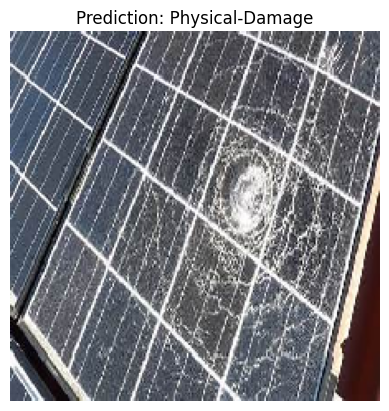

The image belongs to the class: Physical-Damage
Predicted class index: 4
Predicted class label: Physical-Damage


In [13]:
from tensorflow.keras.preprocessing import image

# Load and preprocess the image
img_path = '/kaggle/input/shamsoonnewdata/cracked.jpg' 
predicted_class_index = predict_image_class(model, img_path, CLASS_NAMES)

# Print the predicted class
print(f"Predicted class index: {predicted_class_index}")
print(f"Predicted class label: {CLASS_NAMES[predicted_class_index]}")

In [14]:
# Save the model
model.save('/kaggle/working/solar_panel_mobilenetv2.h5')
print("Model saved.")

Model saved.


In [15]:
from fine_tuning import fine_tune_model
FINE_TUNE_EPOCHS = 20
# Fine-tune the model
fine_tune_history = fine_tune_model(
    model=model,
    train_ds=train_ds,
    val_ds=val_ds,
    base_model_index=1,
    frozen_layers=14,
    learning_rate=0.0001,
    epochs=FINE_TUNE_EPOCHS
)

Epoch 1/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.7080 - loss: 0.8664
Epoch 1: val_loss improved from inf to 0.69645, saving model to best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 74s 316ms/step - accuracy: 0.7087 - loss: 0.8640 - val_accuracy: 0.7780 - val_loss: 0.6964 - learning_rate: 1.0000e-04
Epoch 2/20
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - accuracy: 0.9456 - loss: 0.1717
Epoch 2: val_loss improved from 0.69645 to 0.65150, saving model to best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - accuracy: 0.9456 - loss: 0.1717 - val_accuracy: 0.8021 - val_loss: 0.6515 - learning_rate: 1.0000e-04
Epoch 3/20
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - accuracy: 0.9687 - loss: 0.1085
Epoch 3: val_loss improved from 0.65150 to 0.47633, saving model to best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - accuracy: 0.9689 - loss: 0.1082 - val_accuracy: 0.8558 - val_loss: 0.4763 - learning_rate: 1.0000e-04
Epoch 4/20
109/110 ━━━━━━━━━━━━━━━━━━━━ 0

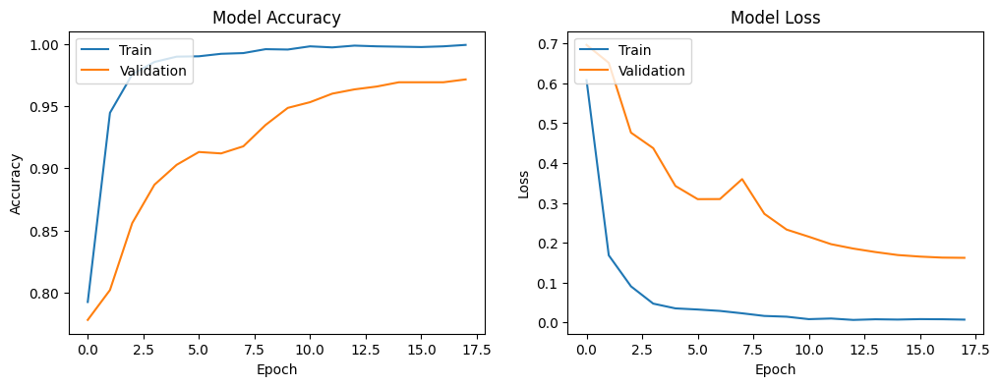

In [16]:
# Plot training history
plot_training_history(fine_tune_history)

In [17]:
# Evaluate model
evaluate_model(model, val_ds)

28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.9718 - loss: 0.1461
Validation Loss: 0.16930371522903442
Validation Accuracy: 0.9691075682640076


(0.16930371522903442, 0.9691075682640076)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


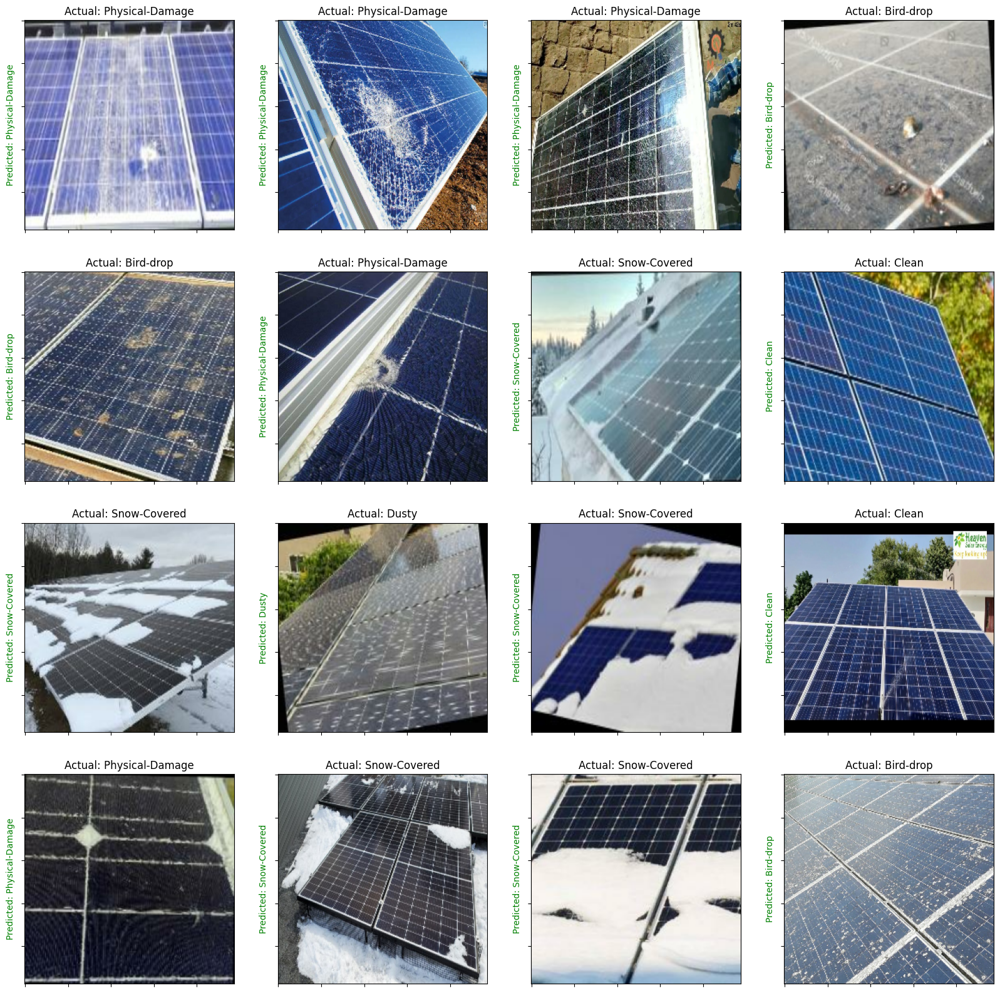

In [18]:
# Visualize predictions
visualize_predictions(model, val_ds, CLASS_NAMES)

In [19]:
model.save("solar_model.h5") 


In [20]:
import tensorflow as tf

# Convert the trained model to TensorFlow Lite format
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the converted model
with open("solar_model.tflite", "wb") as f:
    f.write(tflite_model)


Saved artifact at '/tmp/tmpe4jp643n'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 244, 244, 3), dtype=tf.float32, name='keras_tensor_154')
Output Type:
  TensorSpec(shape=(None, 6), dtype=tf.float32, name=None)
Captures:
  133137595458736: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133137199310352: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133137199308240: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133137199302784: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133137199305952: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133137560212176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133137199266128: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133137199254336: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133137199254512: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133137199260320: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1331371991

# VGG16 Model

In [21]:
# Build the model
model2 = build_model(IMG_HEIGHT, IMG_WIDTH, len(CLASS_NAMES))
model.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 244, 244, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ true_divide (TrueDivide)             │ (None, 244, 244, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ subtract (Subtract)                  │ (None, 244, 244, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 8, 8, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 6)                   │           7,686 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,719,956 (25.63 MB)

 Trainable params: 2,227,142 (8.50 MB)

 Non-trainable params: 38,528 (150.50 KB)

 Optimizer params: 4,454,286 (16.99 MB)

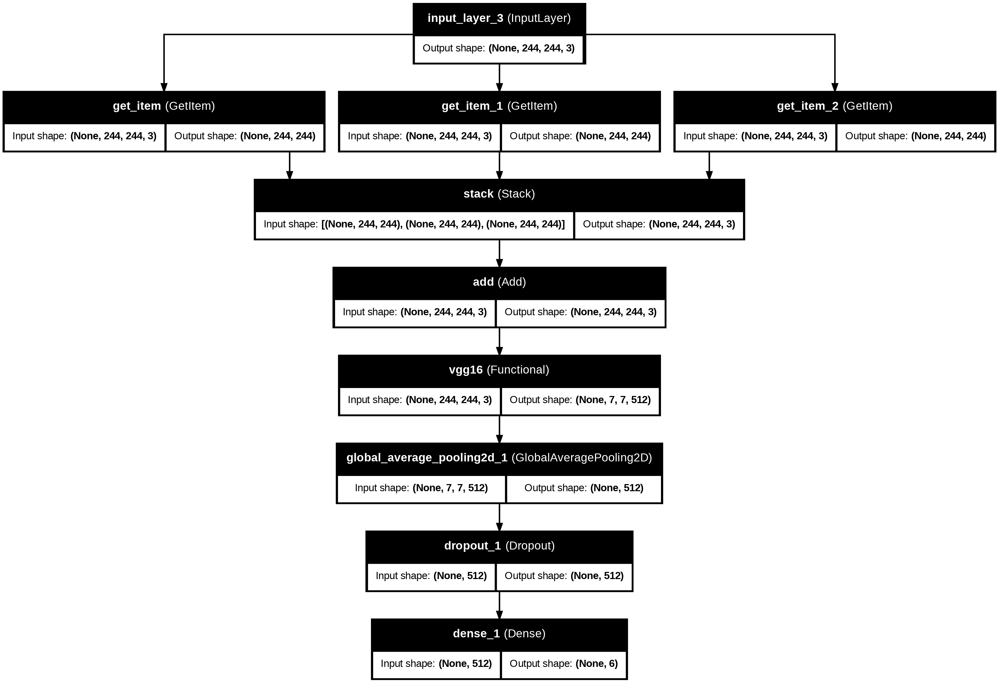

In [22]:
from tensorflow.keras.utils import plot_model

# Plot the model architecture and save it as an image
plot_model(model2, to_file='cnn_plot.png', show_shapes=True, show_layer_names=True)

In [23]:
# Train the model
EPOCHS = 10
print("Training the model...")
history = train_model(model2, train_ds, val_ds, EPOCHS)

Training the model...
Epoch 1/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 59s 358ms/step - accuracy: 0.3033 - loss: 4.7545 - val_accuracy: 0.6339 - val_loss: 1.2557
Epoch 2/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 25s 231ms/step - accuracy: 0.5361 - loss: 1.9460 - val_accuracy: 0.7334 - val_loss: 0.8645
Epoch 3/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 26s 236ms/step - accuracy: 0.6375 - loss: 1.2753 - val_accuracy: 0.7746 - val_loss: 0.6840
Epoch 4/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 26s 238ms/step - accuracy: 0.7023 - loss: 0.9745 - val_accuracy: 0.7952 - val_loss: 0.6013
Epoch 5/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 26s 238ms/step - accuracy: 0.7336 - loss: 0.8322 - val_accuracy: 0.8181 - val_loss: 0.5398
Epoch 6/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 26s 234ms/step - accuracy: 0.7546 - loss: 0.7386 - val_accuracy: 0.8181 - val_loss: 0.5140
Epoch 7/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 26s 236ms/step - accuracy: 0.7724 - loss: 0.6508 - val_accuracy: 0.8249 - val_loss: 0.4882
Epoch 8/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 26s 236ms/step - accu

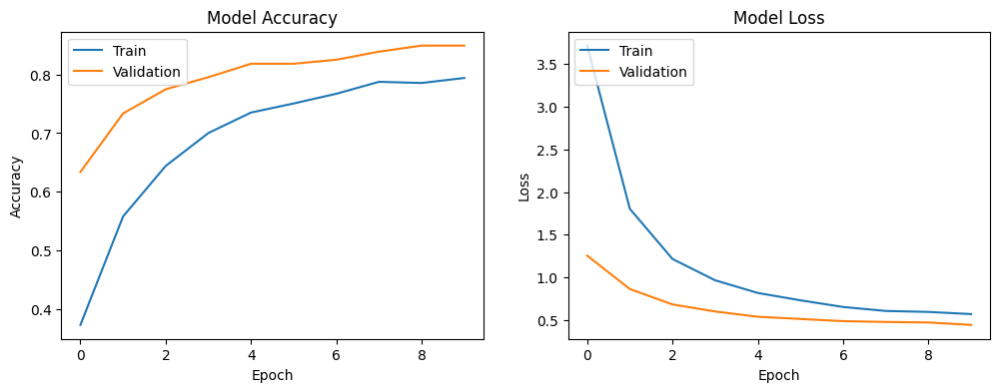

In [24]:
# Plot training history
plot_training_history(history)

In [25]:
# Save the model
model.save('/kaggle/working/solar_panel_fault_classification.h5')
print("Model saved.")

Model saved.


In [26]:
# Evaluate model
evaluate_model(model2, val_ds)

28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 181ms/step - accuracy: 0.8617 - loss: 0.4574
Validation Loss: 0.4443690776824951
Validation Accuracy: 0.8489702343940735


(0.4443690776824951, 0.8489702343940735)

<div style="background: linear-gradient(to right, #FFEDD5, #FFB84D); padding: 10px; border-radius: 10px; box-shadow: 0px 4px 6px rgba(0, 0, 0, 0.1);">
    <h2 style="font-family: Arial, sans-serif; font-size: 28px; text-align: left; color: #007a5f; margin: 0;">
        Fine Tuning:
    </h2>
</div>

In [27]:
from fine_tuning import fine_tune_model
FINE_TUNE_EPOCHS = 10
# Fine-tune the model
fine_tune_history = fine_tune_model(
    model=model2,
    train_ds=train_ds,
    val_ds=val_ds,
    base_model_index=1,
    frozen_layers=14,
    learning_rate=0.0001,
    epochs=FINE_TUNE_EPOCHS
)

Epoch 1/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - accuracy: 0.7653 - loss: 0.6899
Epoch 1: val_loss improved from inf to 0.33810, saving model to best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 40s 310ms/step - accuracy: 0.7657 - loss: 0.6887 - val_accuracy: 0.8867 - val_loss: 0.3381 - learning_rate: 1.0000e-04
Epoch 2/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - accuracy: 0.9115 - loss: 0.2490
Epoch 2: val_loss improved from 0.33810 to 0.22446, saving model to best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 31s 283ms/step - accuracy: 0.9116 - loss: 0.2489 - val_accuracy: 0.9256 - val_loss: 0.2245 - learning_rate: 1.0000e-04
Epoch 3/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - accuracy: 0.9536 - loss: 0.1530
Epoch 3: val_loss improved from 0.22446 to 0.21247, saving model to best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 30s 275ms/step - accuracy: 0.9536 - loss: 0.1529 - val_accuracy: 0.9416 - val_loss: 0.2125 - learning_rate: 1.0000e-04
Epoch 4/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 0

In [28]:
model.save('/kaggle/working/solar_panel_fault_classification_finetuned.h5')
print("Fine-tuned model saved.")

Fine-tuned model saved.


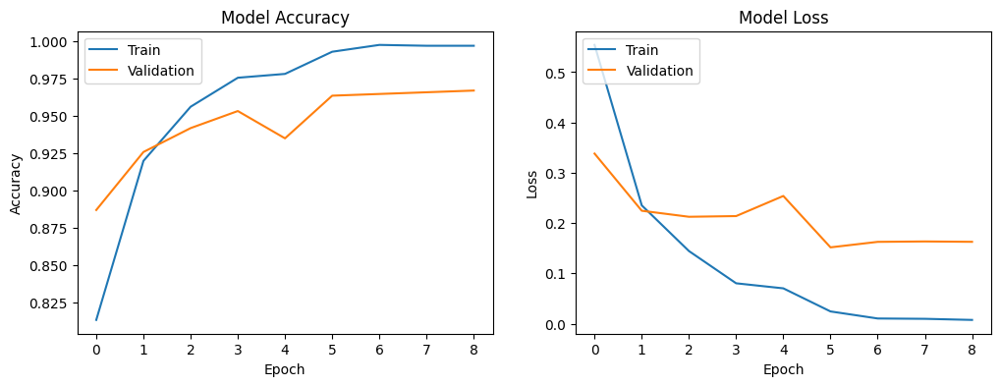

In [29]:
# Plot training history
plot_training_history(fine_tune_history)

In [30]:
# Evaluate model
evaluate_model(model2, val_ds)

28/28 ━━━━━━━━━━━━━━━━━━━━ 6s 181ms/step - accuracy: 0.9629 - loss: 0.1839
Validation Loss: 0.15167853236198425
Validation Accuracy: 0.9633867144584656


(0.15167853236198425, 0.9633867144584656)

In [ ]:
# Visualize predictions
visualize_predictions(model2, val_ds, CLASS_NAMES)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


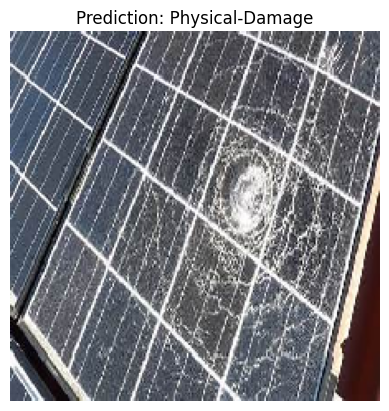

The image belongs to the class: Physical-Damage
Predicted class index: 4
Predicted class label: Physical-Damage


In [32]:
from tensorflow.keras.preprocessing import image

# Load and preprocess the image
img_path = '/kaggle/input/shamsoonnewdata/cracked.jpg' 
predicted_class_index = predict_image_class(model, img_path, CLASS_NAMES)

# Print the predicted class
print(f"Predicted class index: {predicted_class_index}")
print(f"Predicted class label: {CLASS_NAMES[predicted_class_index]}")

<div style="background: linear-gradient(to right, #FFEDD5, #FFB84D); padding: 10px; border-radius: 10px; box-shadow: 0px 4px 6px rgba(0, 0, 0, 0.1);">
    <h2 style="font-family: Arial, sans-serif; font-size: 28px; text-align: left; color: #007a5f; margin: 0;">
        Save best model:
    </h2>
</div>

In [33]:
# Load the best model
from tensorflow.keras.models import load_model

best_model = load_model('best_model.keras')

In [34]:
# Evaluate the model
loss, accuracy = best_model.evaluate(val_ds)
print(f"Validation Loss: {loss}")
print(f"Validation Accuracy: {accuracy}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 7s 197ms/step - accuracy: 0.9639 - loss: 0.1451
Validation Loss: 0.15167854726314545
Validation Accuracy: 0.9633867144584656


In [35]:
def get_predictions(model, dataset):
    y_true = []
    y_pred = []

    for images, labels in dataset:
        predictions = model.predict(images)
        predicted_classes = np.argmax(predictions, axis=1)

        y_true.extend(labels.numpy())  
        y_pred.extend(predicted_classes)

    return np.array(y_true), np.array(y_pred)

def plot_confusion_matrix(y_true, y_pred, class_labels):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()
    
def print_classification_report(y_true, y_pred, class_labels):
    report = classification_report(y_true, y_pred, target_names=class_labels)
    print("Classification Report:\n", report)

In [36]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import seaborn as sns
# Get the true labels and predictions
y_true, y_pred = get_predictions(model, val_ds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

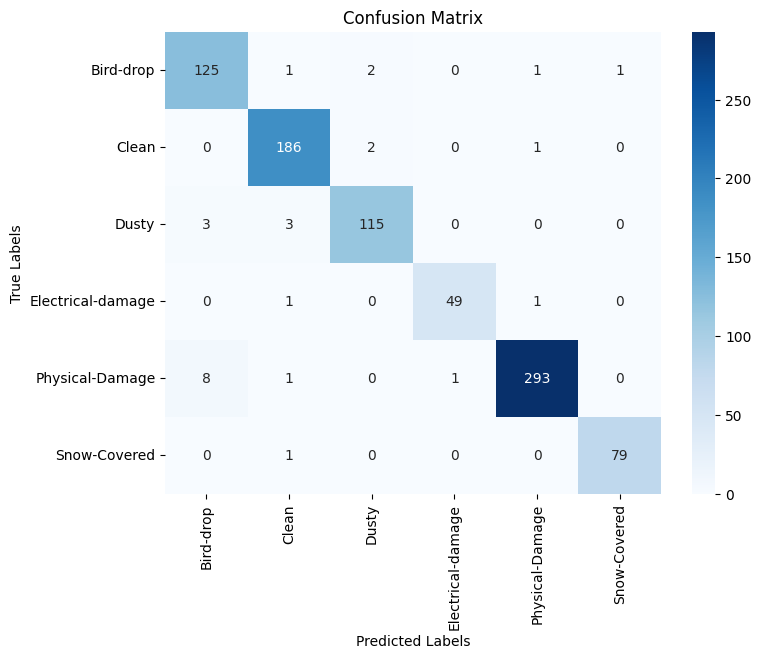

In [37]:
from sklearn.metrics import confusion_matrix, classification_report
# Plot the confusion matrix
plot_confusion_matrix(y_true, y_pred, CLASS_NAMES)

In [38]:
# Print classification report
print_classification_report(y_true, y_pred, CLASS_NAMES)

Classification Report:
                    precision    recall  f1-score   support

        Bird-drop       0.92      0.96      0.94       130
            Clean       0.96      0.98      0.97       189
            Dusty       0.97      0.95      0.96       121
Electrical-damage       0.98      0.96      0.97        51
  Physical-Damage       0.99      0.97      0.98       303
     Snow-Covered       0.99      0.99      0.99        80

         accuracy                           0.97       874
        macro avg       0.97      0.97      0.97       874
     weighted avg       0.97      0.97      0.97       874

